## Load Dataset

In [1]:
# Intstall Requirements
!pip install git+https://github.com/cocodataset/panopticapi.git

  Cloning https://github.com/cocodataset/panopticapi.git to /tmp/pip-req-build-ml76pczk
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/panopticapi.git /tmp/pip-req-build-ml76pczk
  Resolved https://github.com/cocodataset/panopticapi.git to commit 7bb4655548f98f3fedc07bf37e9040a992b054b0
  Preparing metadata (setup.py) ... done


In [ ]:
# Import libraries
import zipfile
import json
import numpy as np
import cv2
from collections import Counter
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
np.random.seed(24) # Set random seed for reproducibility

# Take Subset of Training Data
num_samples = 20000

In [3]:
# Download Dataset
!curl -O http://images.cocodataset.org/zips/train2017.zip
!curl -O http://images.cocodataset.org/zips/val2017.zip
!curl -O http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!curl -O http://images.cocodataset.org/annotations/panoptic_annotations_trainval2017.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 18.0G  100 18.0G    0     0  15.4M      0  0:19:50  0:19:50 --:--:-- 16.2M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  777M  100  777M    0     0  16.3M      0  0:00:47  0:00:47 --:--:-- 17.2M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  241M  100  241M    0     0  12.0M      0  0:00:19  0:00:19 --:--:-- 13.8M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  820M  100  820M    0     0  16.5M      0  0:00:49  0:00:49 --:--:-- 17.8M


In [4]:
# Extract image and annotation files
def unzip(filePath, extractPath):
  with zipfile.ZipFile(filePath, 'r') as zip_ref:
      zip_ref.extractall(extractPath)
unzip('train2017.zip', './coco/images')
unzip('val2017.zip', './coco/images')
unzip('annotations_trainval2017.zip', './coco')
unzip('panoptic_annotations_trainval2017.zip', './coco')
unzip('./coco/annotations/panoptic_val2017.zip', './coco/annotations')
unzip('./coco/annotations/panoptic_train2017.zip', './coco/annotations')

In [5]:
# View Sample Annotation Data
with open('coco/annotations/panoptic_train2017.json', 'r') as f:
       train_segments = json.load(f)
with open('coco/annotations/instances_train2017.json', 'r') as f:
       train_instances = json.load(f)
with open('coco/annotations/panoptic_val2017.json', 'r') as f:
       val_segments = json.load(f)

print('Total Images:', len(train_segments['images']))
print('Total Segments:', len(train_segments['annotations']))
print('Total Instances:', len(train_segments['annotations']))
# Print first annotation to see the structure
print(train_segments['annotations'][0])
print(train_instances['annotations'][0])

Total Images: 118287
Total Segments: 118287
Total Instances: 118287
{'segments_info': [{'id': 8345037, 'category_id': 51, 'iscrowd': 0, 'bbox': [0, 14, 434, 374], 'area': 24315}, {'id': 6968006, 'category_id': 51, 'iscrowd': 0, 'bbox': [312, 4, 319, 229], 'area': 34234}, {'id': 2005197, 'category_id': 51, 'iscrowd': 0, 'bbox': [1, 189, 612, 285], 'area': 70036}, {'id': 3658235, 'category_id': 55, 'iscrowd': 0, 'bbox': [387, 74, 83, 70], 'area': 3566}, {'id': 2803959, 'category_id': 55, 'iscrowd': 0, 'bbox': [376, 40, 76, 47], 'area': 2241}, {'id': 2992357, 'category_id': 55, 'iscrowd': 0, 'bbox': [364, 2, 94, 71], 'area': 2963}, {'id': 2271460, 'category_id': 55, 'iscrowd': 0, 'bbox': [466, 39, 58, 46], 'area': 1660}, {'id': 1720367, 'category_id': 56, 'iscrowd': 0, 'bbox': [250, 229, 316, 245], 'area': 49529}, {'id': 8922372, 'category_id': 189, 'iscrowd': 0, 'bbox': [0, 0, 319, 118], 'area': 17245}, {'id': 7113394, 'category_id': 196, 'iscrowd': 0, 'bbox': [0, 11, 640, 469], 'area': 

In [6]:
from tqdm import tqdm

# Extract a subset random images with their corresponding annotations
train_segments_subset = train_segments.copy()
train_instances_subset = train_instances.copy()

np.random.shuffle(train_segments_subset['images'])
train_segments_subset['images'] = train_segments_subset['images'][:num_samples]
train_image_file_names = [image['file_name'] for image in train_segments_subset['images']]
panoptic_image_file_names = [x.replace('.jpg', '.png') for x in train_image_file_names]
image_ids = [image['id'] for image in train_segments_subset['images']]

train_segments_subset['annotations'] = [x for x in tqdm(train_segments_subset['annotations'], position=0, leave=True, desc='Processing Segment Annotations') if x['image_id'] in image_ids]
train_instances_subset['images'] = [x for x in tqdm(train_instances_subset['images'], position=0, leave=True, desc='Processing Instance Images') if x['id'] in image_ids]
train_instances_subset['annotations'] = [x for x in tqdm(train_instances_subset['annotations'], position=0, leave=True, desc='Processing Instance Annotations') if x['image_id'] in image_ids]

print('\nTotal Subset Train Images/Annotations:', len(train_segments_subset['images']))
print('Total Subset Train Instances Images/Annotations:', len(train_instances_subset['images']))

Processing Instance Annotations: 100%|██████████| 860001/860001 [04:09<00:00, 3445.70it/s]


Total Subset Train Images/Annotations: 20000
Total Subset Train Instances Images/Annotations: 20000


In [7]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [8]:
# Make Directories for Subset Images
!mkdir coco/images/train2017_sub
!mkdir coco/annotations/panoptic_train2017_sub

mkdir: cannot create directory ‘coco/images/train2017_sub’: File exists
mkdir: cannot create directory ‘coco/annotations/panoptic_train2017_sub’: File exists


In [9]:
# Create Subset Data Files
import os
import shutil
import json

def create_subset_image_files(source_dir, dest_dir, condition):
  p_bar = tqdm(range(num_samples), position=0,
               leave=True, desc='Filtering Images... ')
  for filename in os.listdir(source_dir):
      file_path = os.path.join(source_dir, filename)

      if os.path.isfile(file_path) and condition(filename):
          shutil.copy(file_path, dest_dir)
          p_bar.update(1)

# Filter Train Image Files
print('Processing Train Image Files...')
create_subset_image_files('coco/images/train2017/',
                      'coco/images/train2017_sub/',
                      lambda filename: filename in train_image_file_names)
# Filter Train Panoptic Image Files
print('Processing Panoptic Train Image Files...')
create_subset_image_files('coco/annotations/panoptic_train2017/',
                      'coco/annotations/panoptic_train2017_sub/',
                      lambda filename: filename in panoptic_image_file_names)

# Create Filtered Segment Annotations
with open('coco/annotations/panoptic_train2017_sub.json', 'w', encoding="utf-8") as f:
  print('Creating Segment Annotation File...')
  json.dump(train_segments_subset, f)
  print('Segment Annotation File Created:', 'coco/annotations/panoptic_train2017_sub.json')

# Create Filtered Instance Annotations
with open('coco/annotations/instances_train2017_sub.json', 'w', encoding="utf-8") as f:
  print('Creating Instance Annotation File...')
  json.dump(train_instances_subset, f)
  print('Segment Annotation File Created:', 'coco/annotations/instances_train2017_sub.json')

Processing Train Image Files...


Filtering Images... : 100%|██████████| 20000/20000 [01:26<00:00, 232.19it/s]


Processing Panoptic Train Image Files...


Filtering Images... : 100%|██████████| 20000/20000 [00:42<00:00, 472.39it/s]


Creating Segment Annotation File...
Segment Annotation File Created: coco/annotations/panoptic_train2017_sub.json
Creating Instance Annotation File...
Segment Annotation File Created: coco/annotations/instances_train2017_sub.json


In [10]:
# Download panoptic api converter source files
!wget https://raw.githubusercontent.com/cocodataset/panopticapi/master/panoptic_coco_categories.json
!wget https://raw.githubusercontent.com/cocodataset/panopticapi/master/converters/panoptic2semantic_segmentation.py

--2024-12-02 01:06:27--  https://raw.githubusercontent.com/cocodataset/panopticapi/master/panoptic_coco_categories.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13159 (13K) [text/plain]
Saving to: ‘panoptic_coco_categories.json.1’

panoptic_coco_categ 100%[===================>]  12.85K  --.-KB/s    in 0s      

2024-12-02 01:06:28 (117 MB/s) - ‘panoptic_coco_categories.json.1’ saved [13159/13159]

--2024-12-02 01:06:28--  https://raw.githubusercontent.com/cocodataset/panopticapi/master/converters/panoptic2semantic_segmentation.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.


In [11]:
# Convert panoptic to semantic annotations for subset train data
!python panoptic2semantic_segmentation.py \
  --input_json_file coco/annotations/panoptic_train2017_sub.json \
  --semantic_seg_folder coco/annotations/panoptic_stuff_train2017

EXTRACTING FROM...
COCO panoptic format:
	Segmentation folder: coco/annotations/panoptic_train2017_sub
	JSON file: coco/annotations/panoptic_train2017_sub.json
SEMANTIC SEGMENTATION
in PNG format:
	Folder with semnatic segmentations: coco/annotations/panoptic_stuff_train2017


Number of cores: 8, images per core: 2500
Core: 0, 0 from 2500 images processed
Core: 1, 0 from 2500 images processed
Core: 2, 0 from 2500 images processed
Core: 3, 0 from 2500 images processed
Core: 4, 0 from 2500 images processed
Core: 5, 0 from 2500 images processed
Core: 6, 0 from 2500 images processed
Core: 7, 0 from 2500 images processed
Core: 0, 100 from 2500 images processed
Core: 2, 100 from 2500 images processed
Core: 1, 100 from 2500 images processed
Core: 5, 100 from 2500 images processed
Core: 3, 100 from 2500 images processed
Core: 4, 100 from 2500 images processed
Core: 6, 100 from 2500 images processed
Core: 7, 100 from 2500 images processed
Core: 2, 200 from 2500 images processed
Core: 0, 200 fro

In [12]:
# Convert panoptic to semantic annotations for val data
!python panoptic2semantic_segmentation.py \
  --input_json_file coco/annotations/panoptic_val2017.json \
  --semantic_seg_folder coco/annotations/panoptic_stuff_val2017

EXTRACTING FROM...
COCO panoptic format:
	Segmentation folder: coco/annotations/panoptic_val2017
	JSON file: coco/annotations/panoptic_val2017.json
SEMANTIC SEGMENTATION
in PNG format:
	Folder with semnatic segmentations: coco/annotations/panoptic_stuff_val2017


Number of cores: 8, images per core: 625
Core: 0, 0 from 625 images processed
Core: 1, 0 from 625 images processed
Core: 2, 0 from 625 images processed
Core: 3, 0 from 625 images processed
Core: 4, 0 from 625 images processed
Core: 5, 0 from 625 images processed
Core: 6, 0 from 625 images processed
Core: 7, 0 from 625 images processed
Core: 0, 100 from 625 images processed
Core: 2, 100 from 625 images processed
Core: 3, 100 from 625 images processed
Core: 6, 100 from 625 images processed
Core: 1, 100 from 625 images processed
Core: 4, 100 from 625 images processed
Core: 7, 100 from 625 images processed
Core: 5, 100 from 625 images processed
Core: 2, 200 from 625 images processed
Core: 0, 200 from 625 images processed
Core: 6, 

## Explore Dataset

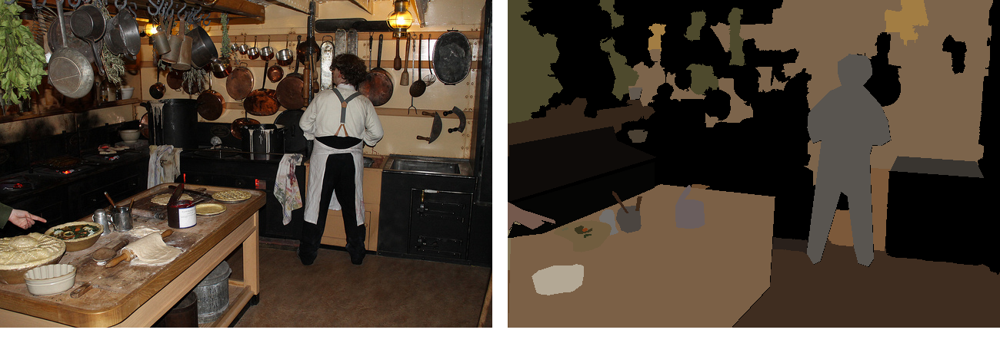

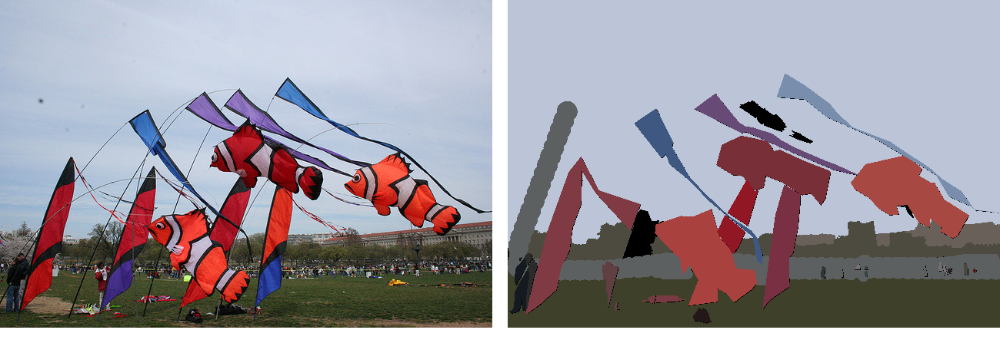

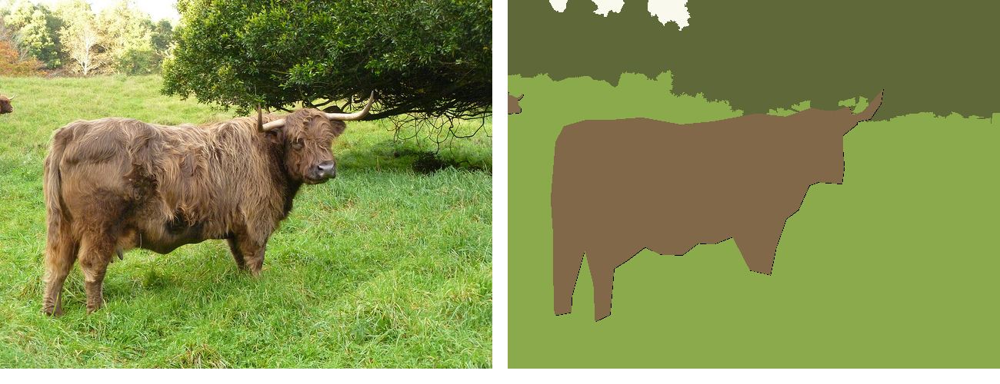

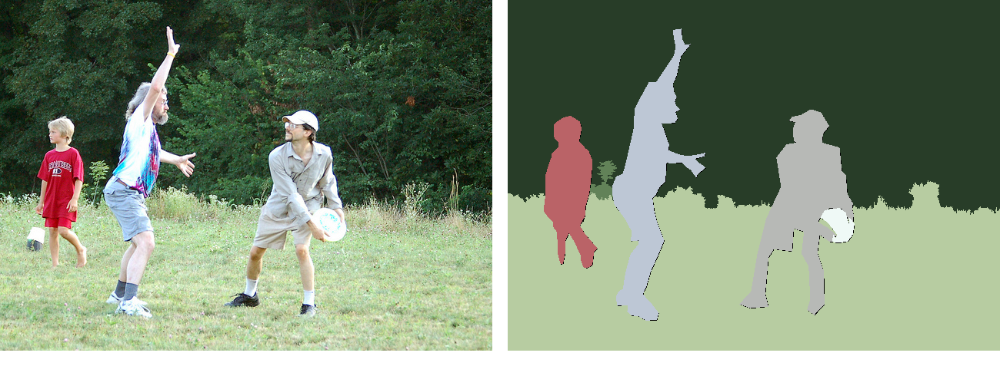

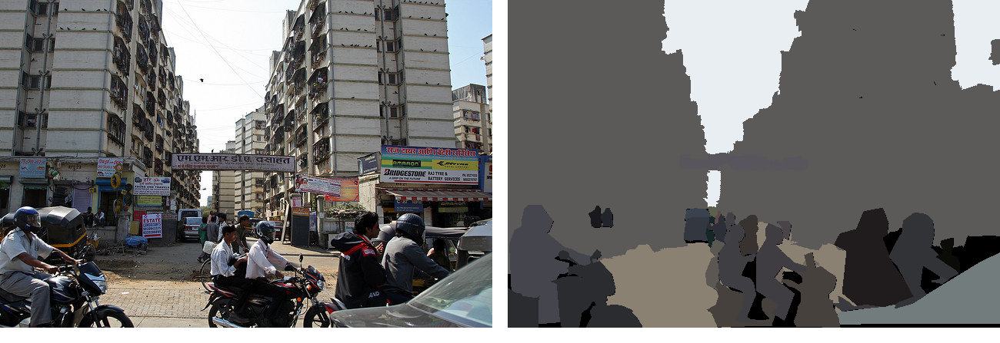

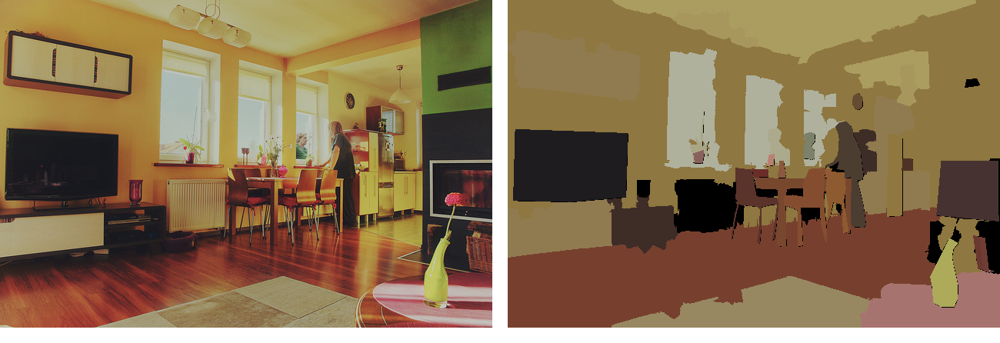

In [13]:
# Visualize Examples
def visualize_example(image_id):
  image_info = [img for img in val_segments['images'] if img['id'] == image_id][0]
  panoptic_ann = [ann for ann in val_segments['annotations'] if ann['image_id'] == image_id][0]

  # Load the image
  image_info_path = 'coco/images/val2017/' + image_info['file_name']
  image_panoptic_path = 'coco/annotations/panoptic_val2017/' + panoptic_ann['file_name']

  # Visualize the image and segmentation
  img_info = cv2.imread(image_info_path)
  img_panoptic = cv2.imread(image_panoptic_path)
  spacer = np.ones((img_info.shape[0], 20, 3), dtype=np.uint8) * 255 # white space

  # Concatenate the images horizontally
  combined_image = cv2.hconcat([img_info, spacer, img_panoptic])
  combined_image = np.vstack((combined_image, np.ones((20, combined_image.shape[1], 3), dtype=np.uint8) * 255)) # white space below

  # Display the combined image
  cv2_imshow(combined_image)

# Visualize some sample images and segmentations
visualize_example(397133)
visualize_example(17959)
visualize_example(518213)
visualize_example(442836)
visualize_example(296649)
visualize_example(139)

Total supercategories: 27


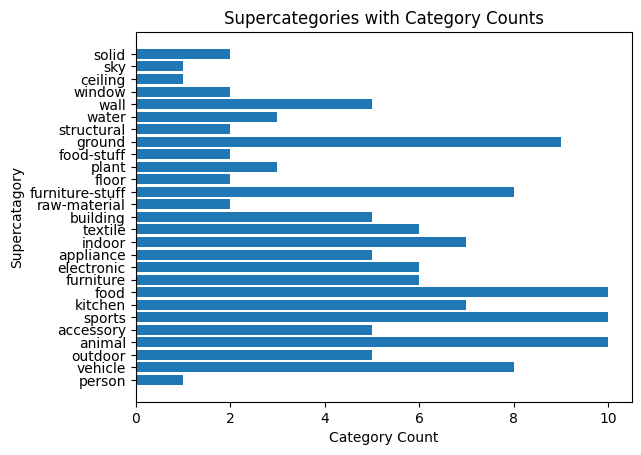

In [14]:
# Plot Supercategories with Category Counts
supercategories = [category['supercategory'] for category in train_segments['categories']]
supercategories_counts = Counter(supercategories)
print('Total supercategories:', len(supercategories_counts))
plt.title('Supercategories with Category Counts')
plt.xlabel('Category Count')
plt.ylabel('Supercatagory')
plt.barh(list(supercategories_counts.keys()), supercategories_counts.values())
plt.show()

In [15]:
# Load COCO categories
with open('panoptic_coco_categories.json', 'r') as f:
    categories_list = json.load(f)

# Create a dictionary to map category IDs to names
thing_classes = [k for k in categories_list if k["isthing"] == 1]
stuff_classes = [k for k in categories_list if k["isthing"] == 0]

# Plot Thing and Stuff Classes
print('Total Categories:', len(categories_list))
print('Total Thing Classes:', len(thing_classes), thing_classes)
print('Total Stuff Classes:', len(stuff_classes), stuff_classes)

Total Categories: 133
Total Thing Classes: 80 [{'supercategory': 'person', 'color': [220, 20, 60], 'isthing': 1, 'id': 1, 'name': 'person'}, {'supercategory': 'vehicle', 'color': [119, 11, 32], 'isthing': 1, 'id': 2, 'name': 'bicycle'}, {'supercategory': 'vehicle', 'color': [0, 0, 142], 'isthing': 1, 'id': 3, 'name': 'car'}, {'supercategory': 'vehicle', 'color': [0, 0, 230], 'isthing': 1, 'id': 4, 'name': 'motorcycle'}, {'supercategory': 'vehicle', 'color': [106, 0, 228], 'isthing': 1, 'id': 5, 'name': 'airplane'}, {'supercategory': 'vehicle', 'color': [0, 60, 100], 'isthing': 1, 'id': 6, 'name': 'bus'}, {'supercategory': 'vehicle', 'color': [0, 80, 100], 'isthing': 1, 'id': 7, 'name': 'train'}, {'supercategory': 'vehicle', 'color': [0, 0, 70], 'isthing': 1, 'id': 8, 'name': 'truck'}, {'supercategory': 'vehicle', 'color': [0, 0, 192], 'isthing': 1, 'id': 9, 'name': 'boat'}, {'supercategory': 'outdoor', 'color': [250, 170, 30], 'isthing': 1, 'id': 10, 'name': 'traffic light'}, {'superca

## Model Training

In [16]:
!python -m pip install pyyaml==5.1
!git clone 'https://github.com/apmalinsky/detectron2_panoptic.git'
import sys, os, distutils.core
dist = distutils.core.run_setup("./detectron2_panoptic/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2_panoptic'))

  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
fatal: destination path 'detectron2_panoptic' already exists and is not an empty directory.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment


In [17]:
import torch, detectron2
!nvcc --version  # Check the CUDA version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.5 ; cuda:  cu121
detectron2: 0.6


In [18]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# Get Metadata for Panoptic Separated Datasets
keys_to_remove = ['name', 'image_root', 'panoptic_root', 'panoptic_json',
                  'sem_seg_root', 'json_file', 'evaluator_type', 'ignore_label']
metadata_train = vars(MetadataCatalog.get('coco_2017_train_panoptic_separated'))
metadata_train = {k: v for k, v in metadata_train.items() if k not in keys_to_remove}
metadata_val = vars(MetadataCatalog.get('coco_2017_val_panoptic_separated'))
metadata_val = {k: v for k, v in metadata_val.items() if k not in keys_to_remove}

In [19]:
from detectron2.data.datasets import register_coco_panoptic_separated

# Register COCO panoptic segmentation datasets
register_coco_panoptic_separated(
    name="coco_train_panoptic",
    metadata=metadata_train,
    image_root="coco/images/train2017_sub",
    panoptic_root="coco/annotations/panoptic_train2017_sub",
    panoptic_json="coco/annotations/panoptic_train2017_sub.json",
    sem_seg_root='coco/annotations/panoptic_stuff_train2017', # directory which contains all the ground truth segmentation annotations.
    instances_json='coco/annotations/instances_train2017_sub.json' # path to the json instance annotation file
)

register_coco_panoptic_separated(
    name="coco_val_panoptic",
    metadata=metadata_val,
    image_root="coco/images/val2017",
    panoptic_root="coco/annotations/panoptic_val2017",
    panoptic_json="coco/annotations/panoptic_val2017.json",
    sem_seg_root='coco/annotations/panoptic_stuff_val2017', # directory which contains all the ground truth segmentation annotations.
    instances_json='coco/annotations/instances_val2017.json' # path to the json instance annotation file
)

In [20]:
# Load Pre-trained Model
import os
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.evaluation import COCOEvaluator
from detectron2 import model_zoo

# Initialize the configuration
cfg = get_cfg()
config_file = "COCO-PanopticSegmentation/panoptic_fpn_R_50_3x.yaml"

# Load a pre-trained model configuration from the model zoo
cfg.merge_from_file(model_zoo.get_config_file(config_file))

# Set the number of classes for thing classes (COCO has 133)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 133
# Set the number of classes for stuff classes (COCO has 200, id 0-200)
cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES = 201

# Specify the dataset names for training and validation
cfg.DATASETS.TRAIN = "coco_train_panoptic_separated"
cfg.DATASETS.TEST = "coco_val_panoptic_separated"

# Set the model checkpoint directory and device
cfg.OUTPUT_DIR = "./output"
cfg.MODEL.DEVICE = "cuda"  # Using GPU for training

# Define solver parameters
cfg.SOLVER.MAX_ITER = 1000
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.STEPS = [7000, 9000]
cfg.SOLVER.GAMMA = 0.1
cfg.SOLVER.IMS_PER_BATCH = 2

# Load the pre-trained weights
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(config_file)

# Ensure the output directory exists
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}
/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


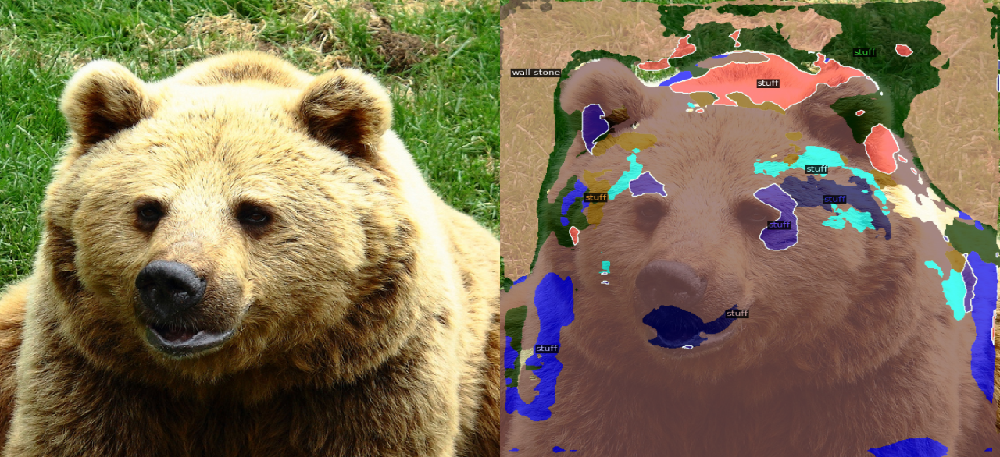

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}


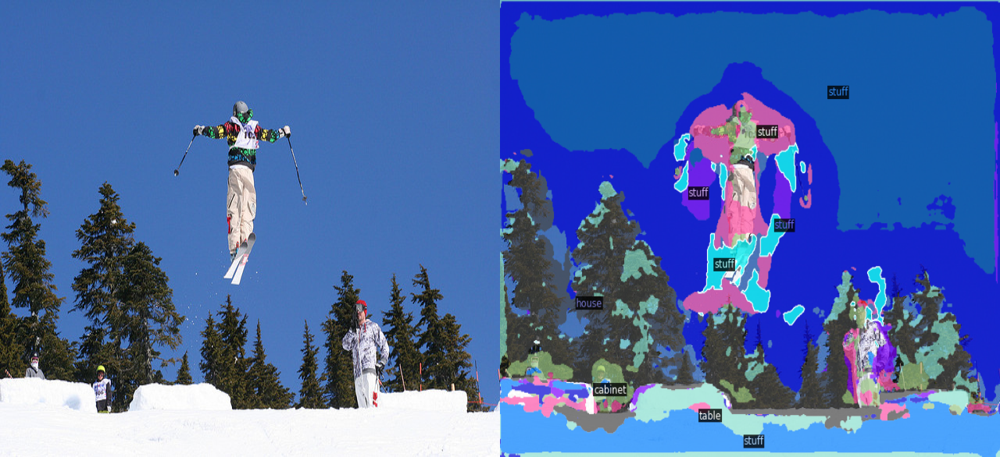

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}


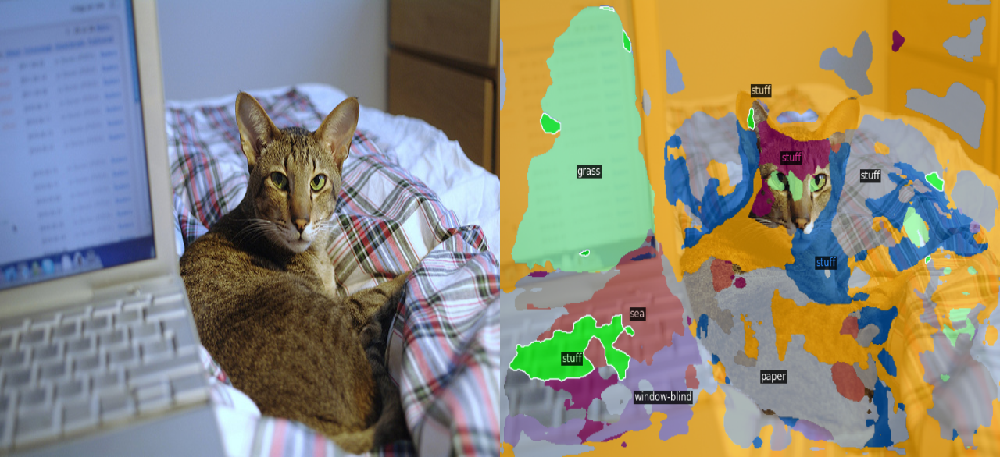

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}


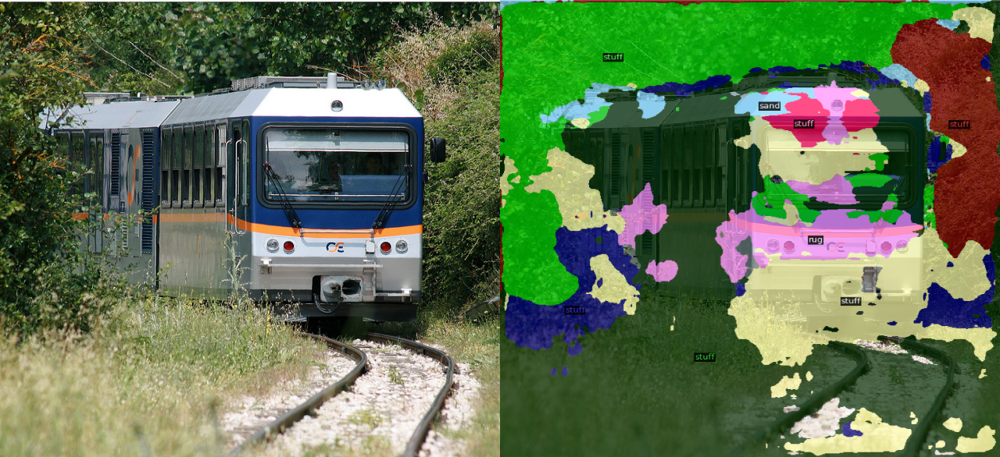

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}


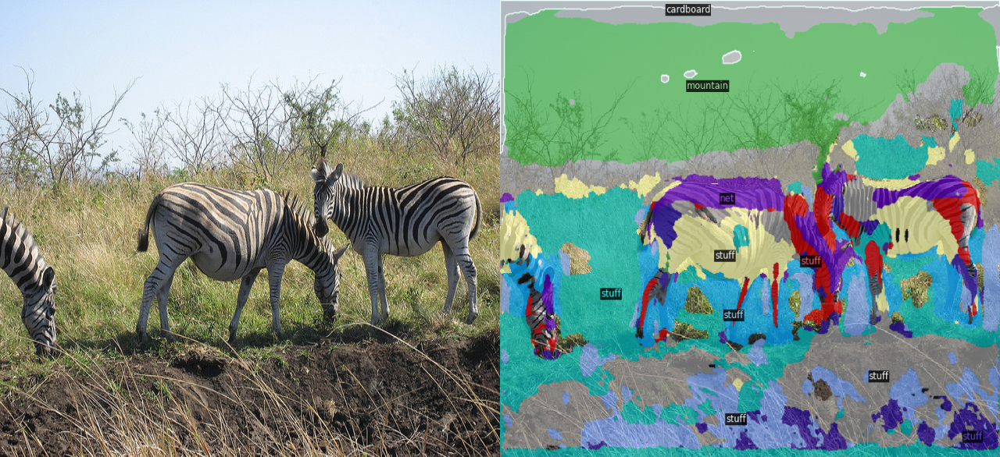

In [21]:
# Test Baseline Model Panoptic Segmentation Predictions
from detectron2.utils.visualizer import Visualizer

def test_prediction(img_file):
  # Test Base Model Prediction
  predictor = DefaultPredictor(cfg)
  sample_img = cv2.imread(img_file)
  outputs = predictor(sample_img)

  # Visualize the results
  v = Visualizer(sample_img, MetadataCatalog.get(cfg.DATASETS.TEST), scale=1.2)
  out = v.draw_panoptic_seg_predictions(outputs["panoptic_seg"][0], outputs["panoptic_seg"][1])

  # Resize images if they have different dimensions
  sample_img = cv2.resize(sample_img, (640, 586))
  sample_pred = cv2.resize(out.get_image(), (640, 586))

  # Concatenate the images horizontally
  horizontal_concat = np.hstack((sample_img, sample_pred))

  # Display the concatenated image
  cv2_imshow(horizontal_concat)

# Test 5 Sample Images
test_prediction("coco/images/val2017/000000000285.jpg")
test_prediction("coco/images/val2017/000000002473.jpg")
test_prediction("coco/images/val2017/000000077595.jpg")
test_prediction("coco/images/val2017/000000039670.jpg")
test_prediction("coco/images/val2017/000000031269.jpg")

In [ ]:
from detectron2.engine import DefaultTrainer

# Create a trainer and start training
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/02 01:07:49 d2.engine.defaults]: Model:
PanopticFPN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2): 

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}


[12/02 01:07:55 d2.engine.train_loop]: Starting training from iteration 0
[12/02 01:08:09 d2.utils.events]:  eta: 0:10:33  iter: 19  total_loss: 9.202  loss_sem_seg: 3.084  loss_rpn_cls: 0.01543  loss_rpn_loc: 0.05417  loss_cls: 4.862  loss_box_reg: 0.4717  loss_mask: 0.692    time: 0.6473  last_time: 0.5142  data_time: 0.0327  last_data_time: 0.0108   lr: 1.9981e-05  max_mem: 6364M
[12/02 01:08:26 d2.utils.events]:  eta: 0:10:32  iter: 39  total_loss: 8.756  loss_sem_seg: 3.094  loss_rpn_cls: 0.01935  loss_rpn_loc: 0.05318  loss_cls: 4.377  loss_box_reg: 0.4712  loss_mask: 0.6898    time: 0.6608  last_time: 0.9496  data_time: 0.0078  last_data_time: 0.0067   lr: 3.9961e-05  max_mem: 6524M
[12/02 01:08:40 d2.utils.events]:  eta: 0:10:30  iter: 59  total_loss: 7.605  loss_sem_seg: 3.11  loss_rpn_cls: 0.01101  loss_rpn_loc: 0.0241  loss_cls: 3.3  loss_box_reg: 0.5003  loss_mask: 0.6871    time: 0.6665  last_time: 0.7828  data_time: 0.0081  last_data_time: 0.0096   lr: 5.9941e-05  max_mem

## Model Evaluation

In [ ]:
# https://cocodataset.org/#panoptic-eval
# import json
# from panopticapi.evaluation import pq_compute

# # ... (Load your predictions in the same format as the COCO annotations)

# # Load ground truth and prediction JSON files
# with open("path/to/ground_truth.json") as f:
#     gt_json = json.load(f)

# with open("path/to/predictions.json") as f:
#     pred_json = json.load(f)

# # Evaluate
# pq_compute(gt_json, pred_json)